# Final Project

### Name: Lydia Ruiz Martínez

### Email: 202213363@alu.comillas.edu

### Subject: Machine Learning 

### Academic Year: 2023/2024

This first part of the final project will analyze the FICO Dataset.csv file. The data contains information
about Home Equity Line of Credit (HELOC) applications made by real homeowners. A HELOC is a line
of credit typically offered by a bank as a percentage of home equity (the difference between the current
market value of a home and its purchase price). The fundamental task is to use the information about the
applicant in their credit report to predict whether they will repay their HELOC account within 2 years.

In [1]:
# Import standard libraries for data manipulation and mathematical operations
import numpy as np
import pandas as pd

# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Import clustering algorithms and visualizers
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Import dimensionality reduction techniques
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Import hierarchical clustering and linkage from SciPy
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.stats as stats  # Import Scipy for additional statistical functions
from scipy.stats import mode

# Import machine learning tools from sklearn
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.calibration import CalibratedClassifierCV

# Import sklearn metrics for model evaluation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, log_loss

# Import custom modules (assuming these are previously defined elsewhere in your project)
from src.logistic_regressor import LogisticRegressor
from src.utils import classification_report
from src.cross_validation import cross_validation

# Set seaborn style for plots
sns.set()

# Suppress warnings if needed
import warnings
warnings.filterwarnings('ignore')

from config import data_path

#### **PART 1:** *Exploratory Data Analysis* -> preprocessing and cleansing

The objective of this part is to explore and obtain information from a real dataset. We will perform the following tasks:

1. Exploratory Data Analysis (EDA)

    1.1. Import the data

    1.2 Deal with missing values (NA)

    1.3 Plot the data and look for outliers

    1.4 Encode categorical variables 
    
    1.5 Analyse continuous variables

    1.6 Deal with class imbalances if needed

2. Divide data into train and test sets

In [2]:
df = pd.read_csv(data_path, sep = ";")

# Show descriptive statistics for all columns
df.describe(include="all")

,RiskPerformance,ExternalRiskEstimate,NetFractionRevolvingBurden,AverageMInFile,MSinceOldestTradeOpen,PercentTradesWBalance,PercentInstallTrades,NumSatisfactoryTrades,NumTotalTrades,PercentTradesNeverDelq,MSinceMostRecentInqexcl7days
count,5245.000000,7442.000000,7442.000000,7442.000000,7415.000000,7386.000000,7442.000000,7425.000000,7419.000000,7442.000000,7442.000000
mean,0.510391,71.326525,34.593926,77.422736,201.894673,65.196994,33.838753,21.640673,23.357191,91.835125,2.257861
std,0.499940,11.719087,28.942289,33.215290,99.467788,22.518968,17.109726,11.529218,12.817841,14.011211,4.899668
min,0.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,0.000000,64.000000,9.000000,57.000000,135.500000,50.000000,21.000000,13.000000,14.000000,89.000000,0.000000
50%,1.000000,72.000000,29.000000,75.000000,186.000000,67.000000,33.000000,20.000000,22.000000,97.000000,0.000000
75%,1.000000,80.000000,56.000000,95.000000,262.000000,82.000000,45.000000,28.000000,30.000000,100.000000,3.000000
max,1.000000,94.000000,232.000000,322.000000,803.000000,100.000000,100.000000,78.000000,100.000000,100.000000,24.000000


In [3]:
# Show first 5 rows for quickly testing our objects
df.head()

,RiskPerformance,ExternalRiskEstimate,NetFractionRevolvingBurden,AverageMInFile,MSinceOldestTradeOpen,PercentTradesWBalance,PercentInstallTrades,NumSatisfactoryTrades,NumTotalTrades,PercentTradesNeverDelq,MSinceMostRecentInqexcl7days
0,1.0,55,33,84,144.0,69.0,43,20.0,23.0,83,0
1,1.0,61,0,41,58.0,0.0,67,2.0,7.0,100,0
2,1.0,67,53,24,66.0,86.0,44,9.0,9.0,100,0
3,1.0,66,72,73,169.0,91.0,57,28.0,30.0,93,0
4,1.0,81,51,132,333.0,80.0,25,12.0,12.0,100,0


'RiskPerformance' data type: float64
Unique values in 'RiskPerformance': [ 1.  0. nan]
RiskPerformance
1.0    2677
0.0    2568
Name: count, dtype: int64


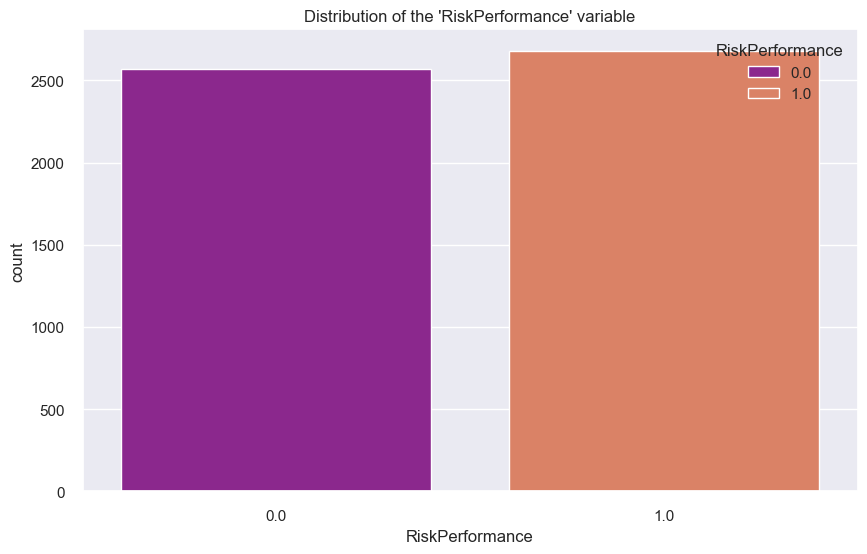

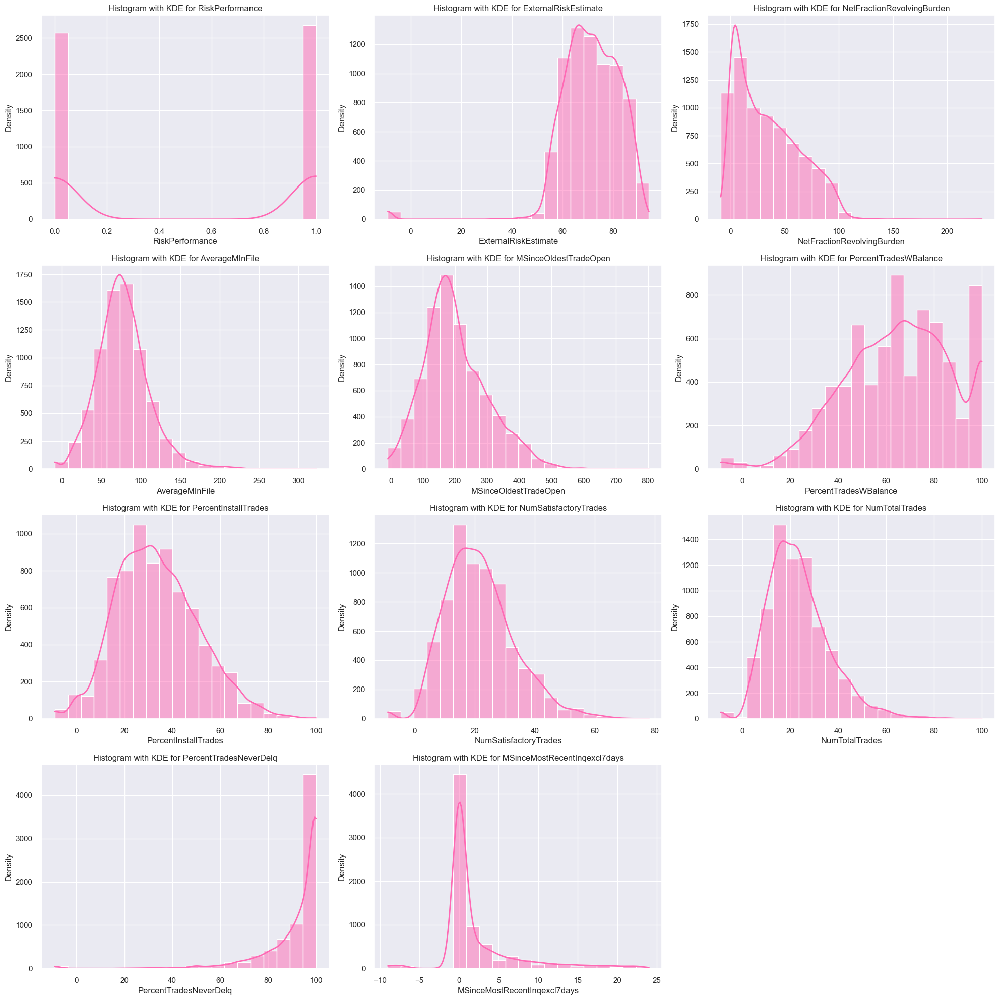

In [4]:
# Print the data type of the 'RiskPerformance' column
print("'RiskPerformance' data type:", df['RiskPerformance'].dtype)

# Print unique values in the 'RiskPerformance' column to understand its categories
print("Unique values in 'RiskPerformance':", df['RiskPerformance'].unique())

# Print the count of each unique value in the 'RiskPerformance' column
print(df['RiskPerformance'].value_counts())

# Set up the figure size for the countplot
plt.figure(figsize=(10, 6))

# Create a countplot for the 'RiskPerformance' variable, color-coded by the same variable
# This is somewhat redundant as hue and x are the same, it will show a single color per category
sns.countplot(data=df, x='RiskPerformance', hue='RiskPerformance', palette='plasma')
plt.title("Distribution of the 'RiskPerformance' variable")  # Set the title for the plot
plt.show()  # Display the plot

# Select columns in the DataFrame that are of numeric data type
numeric_cols = df.select_dtypes(include=[np.number]).columns 

# Determine the number of columns for subplot arrangement
n_cols = 3  

# Calculate the number of rows needed based on the number of numeric columns
n_rows = int(np.ceil(len(numeric_cols) / n_cols)) 

# Set up the figure size based on the number of rows and columns
plt.figure(figsize=(20, 5 * n_rows))

# Loop through each numeric column to create a histogram with KDE plot
for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)  # Position each subplot in the figure grid
    sns.histplot(df[col], bins=20, kde=True, color='hotpink', line_kws={'linewidth': 2})
    plt.title('Histogram with KDE for ' + col)  # Set the title for each histogram
    plt.xlabel(col)  # Set the x-axis label as the column name
    plt.ylabel('Density')  # Set the y-axis label as 'Density'

plt.tight_layout()  # Adjust subplots to fit into figure area nicely
plt.show()  # Display all the histograms with KDE plots

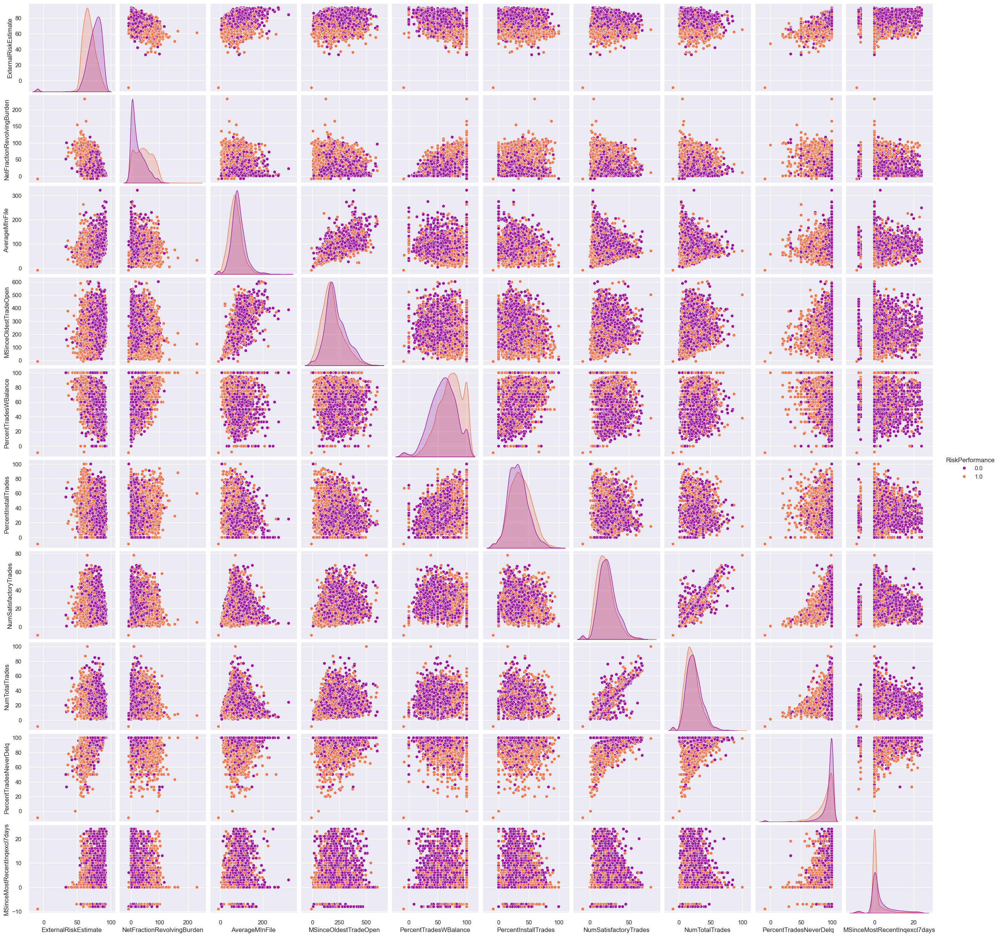

In [5]:
# Visualize the relationships between 'RiskPerformance' and other numerical variables
sns.pairplot(data=df, hue='RiskPerformance', palette='plasma')
plt.show()


In [6]:

# mask = np.triu(np.ones_like(corr_matrix, dtype=bool)) & ~np.diag(np.diag(np.ones_like(corr_matrix, dtype = bool)))
# sns.heatmap(corr_matrix, mask = mask, annot = True, fmt=".2f", cmap="vlag", center = 0, vmax = 1, vmin = -1)

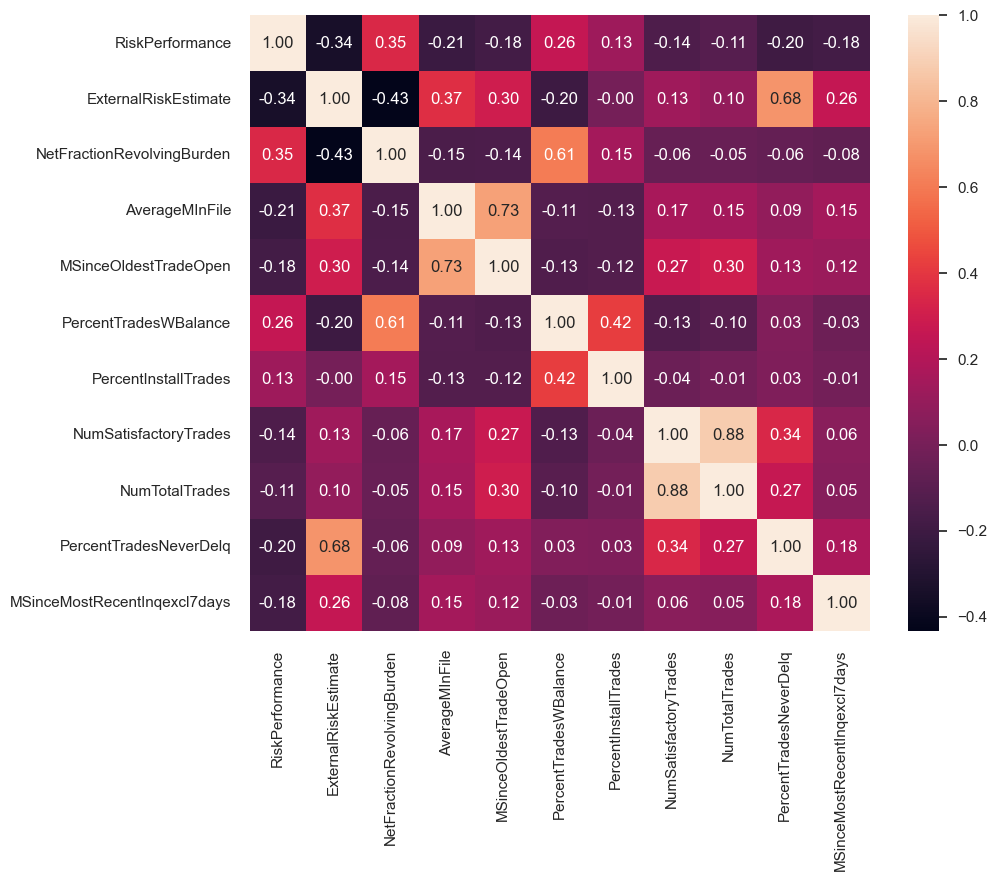

The variables NumSatisfactoryTrades and NumTotalTrades are highly correlated.


In [7]:
# Pearson correlation matrix
corr_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap = "rocket")
plt.show()
print("The variables NumSatisfactoryTrades and NumTotalTrades are highly correlated.")

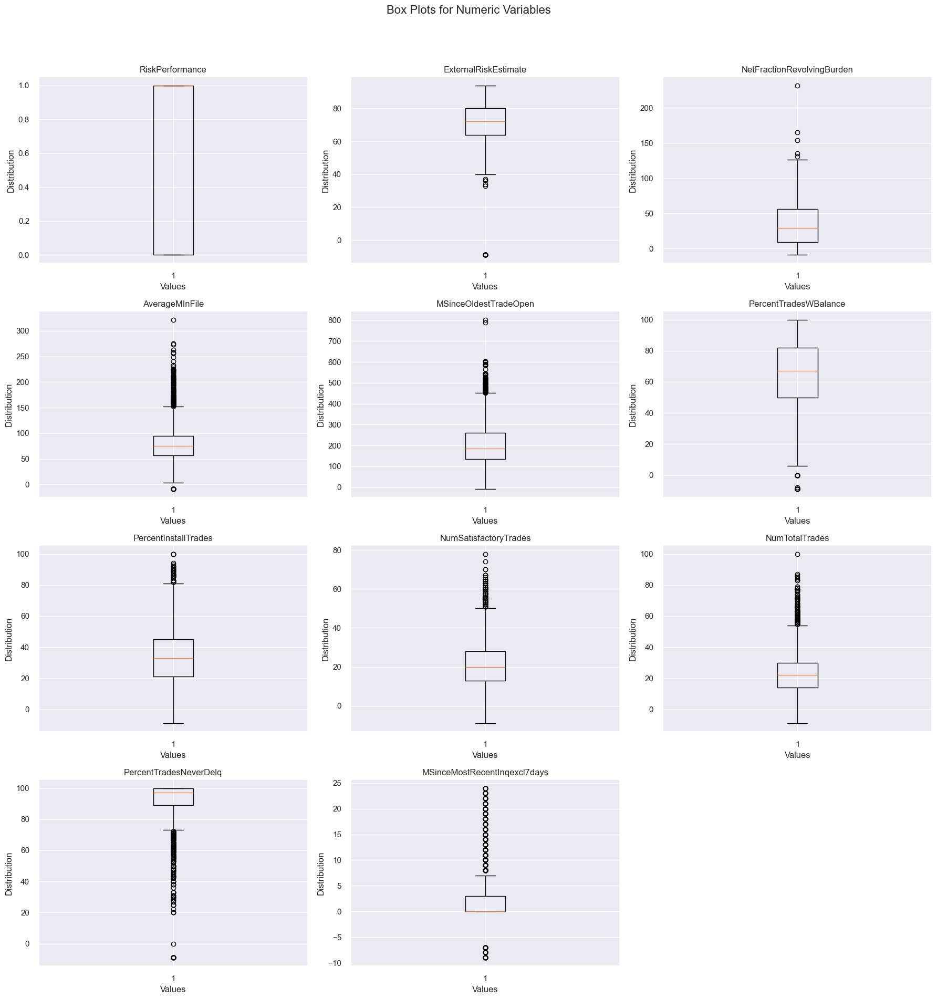

In [8]:
# LOOKING FOR OUTLIERS - Box Plots
numeric_cols = df.select_dtypes(include=[np.number]).columns
num_vars = len(numeric_cols) 
n_cols = 3 
n_rows = (num_vars + n_cols - 1) // n_cols  

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 5)) 
fig.suptitle('Box Plots for Numeric Variables', fontsize=16)  

axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    axes[i].boxplot(df[col].dropna())  
    axes[i].set_title(col)
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Distribution')

for j in range(i + 1, n_rows * n_cols):
    axes[j].set_visible(False)  

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
plt.show()

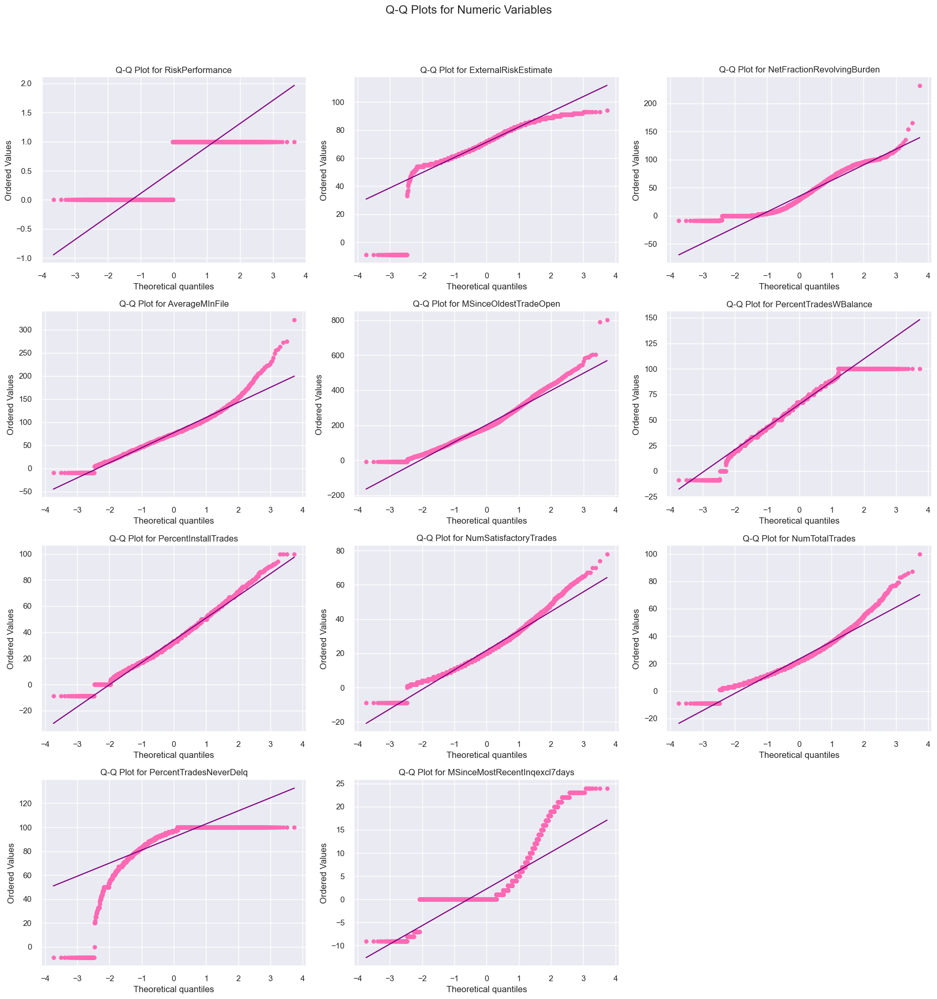

In [9]:
# LOOKING FOR OUTLIERS - Q-Q plots for each predictor variable

numeric_cols = df.select_dtypes(include=[np.number]).columns
num_vars = len(numeric_cols) 

n_cols = 3  
n_rows = (num_vars + n_cols - 1) // n_cols  

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 5))
fig.suptitle('Q-Q Plots for Numeric Variables', fontsize=16)  

axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    stats.probplot(df[col].dropna(), dist="norm", plot=axes[i]) 
    axes[i].get_lines()[0].set_color('hotpink')  
    axes[i].get_children()[1].set_color('purple')  
    axes[i].set_title('Q-Q Plot for ' + col)

for j in range(i + 1, n_rows * n_cols):
    axes[j].set_visible(False)  

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
plt.show()

We could use one-hot encoding or dummy encoding to encode categorical variables, however, since every variable in this dataset is numerical, it is not necessary.


In [10]:
# MISSING VALUES -Check null values after replacing special characters
print("Null values\n")
df = df.replace([-8, -7], np.nan)
missing_values = df.isna().sum()
print(missing_values)

Null values

RiskPerformance                 2197
ExternalRiskEstimate               0
NetFractionRevolvingBurden        11
AverageMInFile                     0
MSinceOldestTradeOpen             28
PercentTradesWBalance             57
PercentInstallTrades               0
NumSatisfactoryTrades             17
NumTotalTrades                    23
PercentTradesNeverDelq             0
MSinceMostRecentInqexcl7days      89
dtype: int64


In [11]:
df_cleaned = df.dropna(subset=['RiskPerformance'])
df_cleaned = df_cleaned[~(df_cleaned == -9).any(axis=1)]

In [12]:
imputer = KNNImputer(n_neighbors=5)
df_cleaned = pd.DataFrame(imputer.fit_transform(df_cleaned), columns=df_cleaned.columns)

<Axes: >

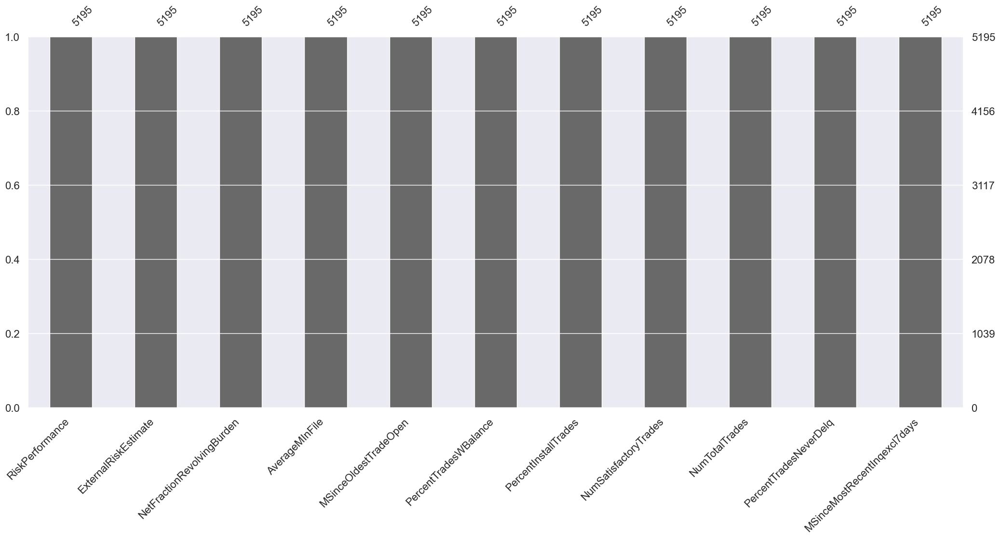

In [13]:
msno.bar(df_cleaned)

In [14]:
INPUTS = df_cleaned.columns[df_cleaned.columns != 'RiskPerformance'].tolist()
OUTPUT = 'RiskPerformance'

X = df_cleaned[INPUTS]
y = df_cleaned[OUTPUT]        

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'Training set size: {X_train.shape[0]}')
print(f'Test set size: {X_test.shape[0]}')

Training set size: 4156
Test set size: 1039


In [15]:
scaler = StandardScaler()

# Scale the training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### **PART 2:** *Classification* -> choosing the right model(s) and training it

The objective of this part is to compare the performance of different classification algorithms with a real
dataset. Based on the training and test sets from Part 1, we will:
1. Identify and do the fitting process of classification models. 
2. Comparative analysis of the fitted models. 

**Logistic regression + regularization**

The optimum value of C based on accuracy is: 2.5118864315095824


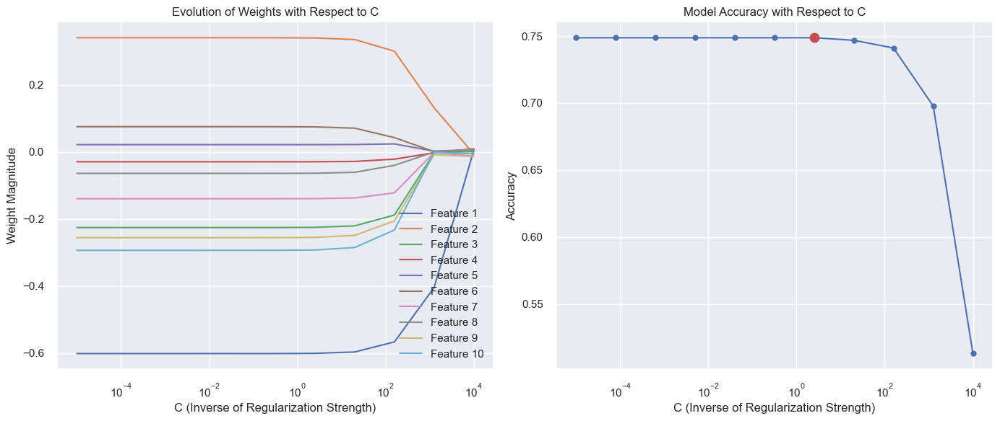

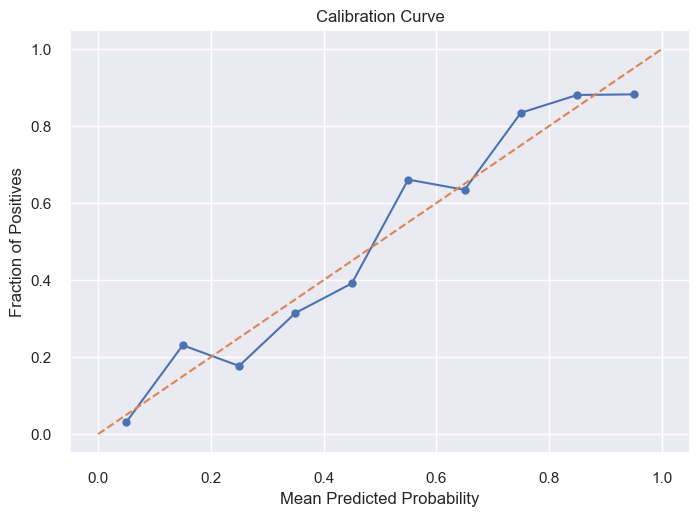

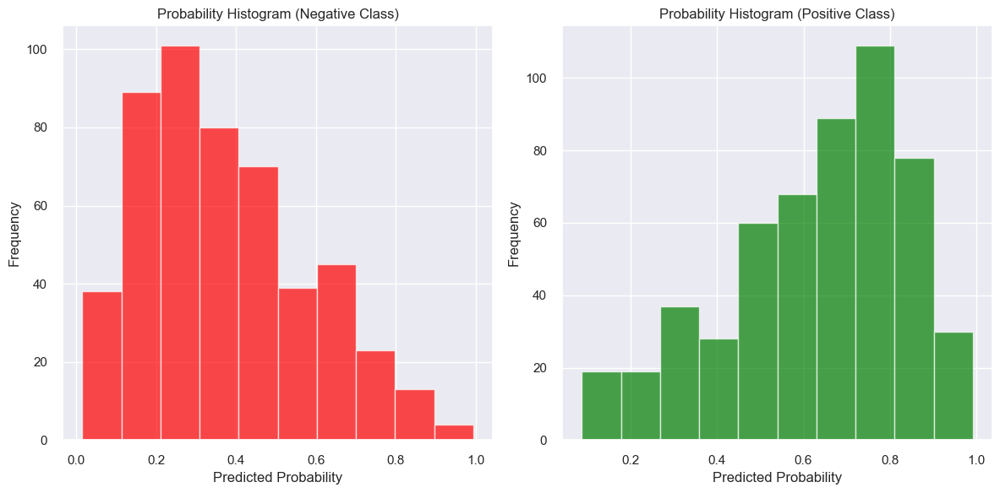

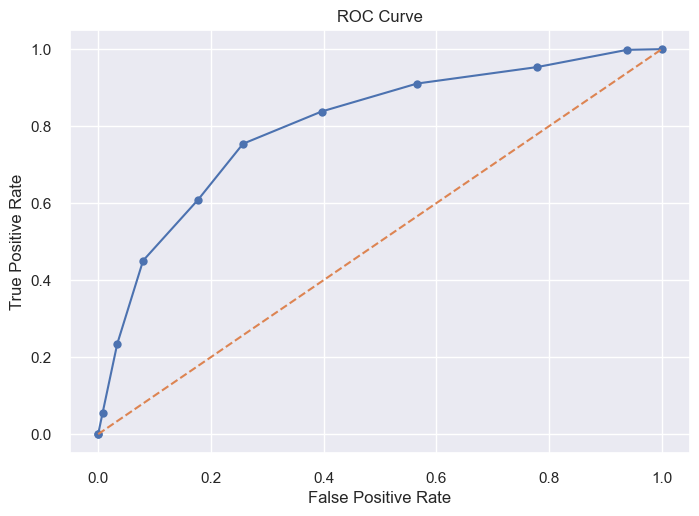

{'Confusion Matrix': [373, 129, 132, 405],
 'Accuracy': 0.7487969201154957,
 'Precision': 0.7584269662921348,
 'Recall': 0.7541899441340782,
 'Specificity': 0.7430278884462151,
 'F1 Score': 0.7563025210084034}

In [16]:
num_iterations = 1000     
learning_rate = 0.01    
pow_min = -5
pow_max = 4  
C_values = np.logspace(pow_min, pow_max, num=11) 
weights_evolution = []  
accuracies = []

# Train models with different values of C
for C in C_values:
    model = LogisticRegressor()
    model.fit(X_train_scaled, y_train, learning_rate=learning_rate, num_iterations=num_iterations, penalty='elasticnet', C=C)
    weights_evolution.append(model.weights)
    y_pred = model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)

# Plotting the evolution of weights and accuracy
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)

# Evolution of weights
for feature_index in range(len(weights_evolution[0])):
    weight_trajectory = [weights[feature_index] for weights in weights_evolution]
    plt.plot(C_values, weight_trajectory, label=f'Feature {feature_index + 1}')
plt.xscale('log')
plt.xlabel('C (Inverse of Regularization Strength)')
plt.ylabel('Weight Magnitude')
plt.title('Evolution of Weights with Respect to C')
plt.legend(loc='best')
plt.grid(True)

# Plot accuracy
max_accuracy = max(accuracies)
optimum_C_values = [C_values[i] for i, accuracy in enumerate(accuracies) if accuracy == max_accuracy]
optimum_C = max(optimum_C_values)

print(f"The optimum value of C based on accuracy is: {optimum_C}")
plt.subplot(1, 2, 2)
plt.plot(C_values, accuracies, marker='o', linestyle='-')
plt.plot(optimum_C, max_accuracy, 'ro', markersize=10, label='Optimum C')
plt.xscale('log')
plt.xlabel('C (Inverse of Regularization Strength)')
plt.ylabel('Accuracy')
plt.title('Model Accuracy with Respect to C')
plt.grid(True)

plt.tight_layout()
plt.show()

# Retrain with optimum C
LogReg_optimum_C = LogisticRegressor()
LogReg_optimum_C.fit(X_train_scaled, y_train, 
                           learning_rate = learning_rate, 
                           num_iterations = num_iterations, 
                           penalty = 'elasticnet', 
                           C = optimum_C)

y_test_prob = LogReg_optimum_C.predict_proba(X_test_scaled)

# Evaluate model
classification_report(y_test, y_test_prob, 1)

**KNN + cross validation**

Optimal value of k: 83 with a score of 0.73


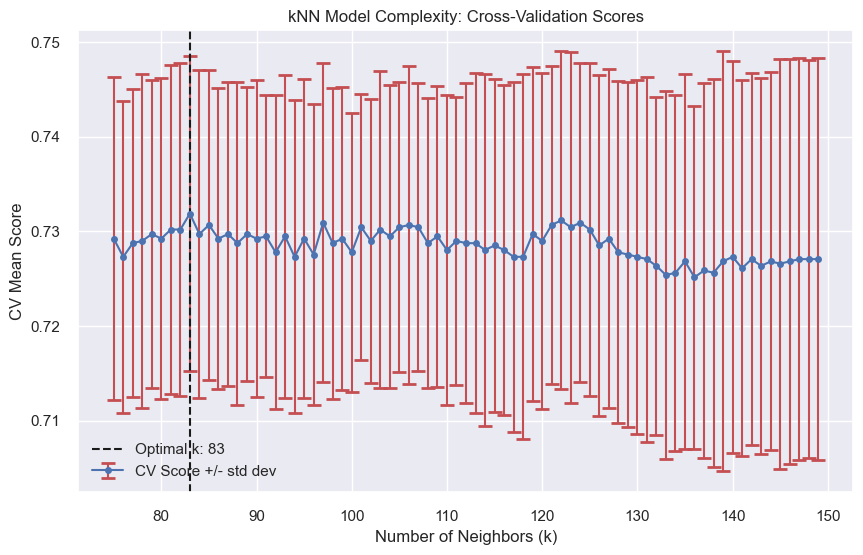

Accuracy, train = 0.7360442733397498 test = 0.7449470644850819


In [17]:
# Initialize lists to store mean scores and standard deviations for each value of k
mean_scores = []
std_scores = []

# Define the range of k values to test
k_values = range(75, 150)
for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    mean_score, std_score = cross_validation(model, X_train_scaled, y_train.values, nFolds=5)  # Assuming 5-fold CV and X, y are defined
    mean_scores.append(mean_score)
    std_scores.append(std_score)
highest_score = max(mean_scores)
optimal_k = k_values[mean_scores.index(highest_score)]

print(f"Optimal value of k: {optimal_k} with a score of {highest_score:.2f}")

# Plotting
plt.figure(figsize=(10, 6))
plt.errorbar(k_values, mean_scores, yerr=std_scores, fmt='-o', ecolor='r', capsize=5, capthick=2, markersize=5, label='CV Score +/- std dev')
plt.axvline(x=optimal_k, linestyle='--', color='k', label=f'Optimal k: {optimal_k}')

plt.title('kNN Model Complexity: Cross-Validation Scores')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('CV Mean Score')
plt.legend()
plt.grid(True)
plt.show()


KNeighbors = KNeighborsClassifier(n_neighbors=optimal_k)
KNeighbors.fit(X_train_scaled, y_train)

y_pred_train = KNeighbors.predict(X_train_scaled)
y_pred_test = KNeighbors.predict(X_test_scaled)
acc_train = accuracy_score(y_train, y_pred_train)
acc_test = accuracy_score(y_test, y_pred_test)
print(f'Accuracy, train = {acc_train} test = {acc_test}')


**Support Vector Machine (SVM)**

In [18]:
### Load necessary modules -------------------------------
# interactive plotting
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # ‘png’, ‘retina’, ‘jpeg’, ‘svg’, ‘pdf’

**Linear SVM Model**

In [19]:
INPUTS_LSVC = INPUTS

# Define la estructura del modelo SVM con los parámetros a probar
param = {'SVC__C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100]} # Parámetros de Costo
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('SVC', SVC(kernel='linear', probability=True, random_state=150))])

# Configura la búsqueda en cuadrícula con validación cruzada
nFolds = 5
Linear_SVC_gcv = GridSearchCV(estimator=pipe,
                              param_grid=param,
                              n_jobs=-1,
                              scoring='accuracy',
                              cv=nFolds)
# Train and find the best parameters with GridSearchCV
Linear_SVC_gcv.fit(X_train[INPUTS_LSVC], y_train)

# The best estimator from the GridSearchCV is passed to CalibratedClassifierCV
Linear_SVC_fit = CalibratedClassifierCV(Linear_SVC_gcv.best_estimator_, method='isotonic', cv='prefit')
Linear_SVC_fit.fit(X_train[INPUTS_LSVC], y_train)

# Ahora puedes usar Linear_SVC_fit para hacer predicciones
# Por ejemplo:
y_pred = Linear_SVC_fit.predict(X_test[INPUTS_LSVC])
y_pred_probs = Linear_SVC_fit.predict_proba(X_test[INPUTS_LSVC])

# Y para calcular la precisión (accuracy):
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy on test set: {accuracy}')

Accuracy on test set: 0.7353224254090471


**Radial SVM Model**

In [20]:
# Inputs del modelo
INPUTS_RSVC = INPUTS

radial_svm = SVC(kernel='rbf')

# Define la estructura del modelo SVM con los parámetros a probar
param = {
    'SVC__C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100],  # Término de Costo
    'SVC__gamma': [0.0001, 0.001, 0.01, 0.1, 0.4]  # Parámetro de ancho inverso en el kernel Gaussiano RBF
}

pipe = Pipeline(steps=[
    ('scaler', StandardScaler()), 
    ('SVC', SVC(kernel='rbf',  # Kernel RBF
                probability=True,  # Permite que el modelo prediga probabilidades
                random_state=150))  # Para replicación
])

# Configura la búsqueda en cuadrícula con validación cruzada
nFolds = 10
SVC_fit = GridSearchCV(estimator=pipe, 
                       param_grid=param, 
                       n_jobs=-1, 
                       scoring='accuracy', 
                       cv=nFolds)

# Entrenamiento y búsqueda del mejor conjunto de parámetros
SVC_fit.fit(X_train[INPUTS_RSVC], y_train)

# Los mejores parámetros encontrados
print('Best parameters found:', SVC_fit.best_params_)

# Los mejores resultados de validación cruzada
print('Best cross-validation score:', SVC_fit.best_score_)

# Evaluar el modelo en el conjunto de prueba
best_model = SVC_fit.best_estimator_
y_test_pred = best_model.predict(X_test[INPUTS_RSVC])

# Calcular la precisión en el conjunto de prueba
from sklearn.metrics import accuracy_score
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f'Accuracy on test set: {test_accuracy}')

Best parameters found: {'SVC__C': 100, 'SVC__gamma': 0.001}
Best cross-validation score: 0.7350886237256719
Accuracy on test set: 0.7478344562078922


**Decision Trees I: Bagging**

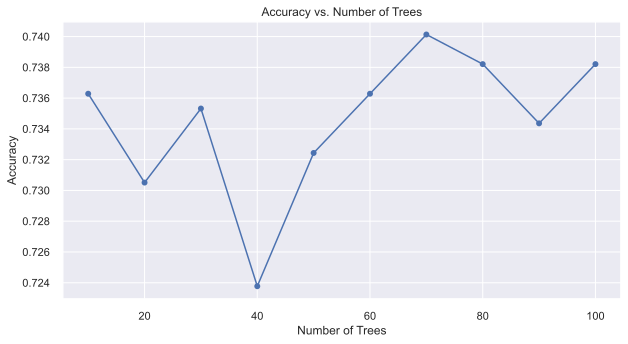

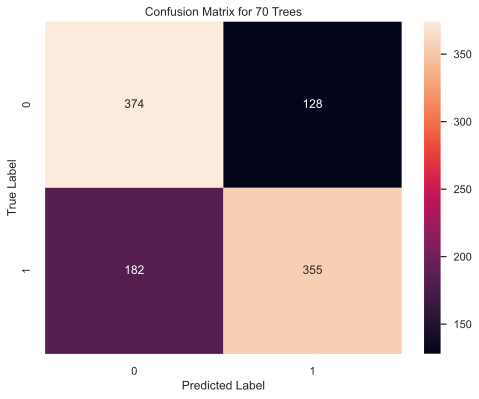

In [21]:
max_samples = 0.8
n_estimators_range = range(10, 101, 10)  
overall_accuracy = []

for n_estimators in n_estimators_range:
    predictions = []
    for _ in range(n_estimators):
        sample_indices = np.random.choice(X_train.index, size=int(len(X_train) * max_samples), replace=True)
        X_bootstrap = X_train.loc[sample_indices]
        y_bootstrap = y_train.loc[sample_indices]

        decision_tree = BaggingClassifier()
        decision_tree.fit(X_bootstrap, y_bootstrap)

        y_pred = decision_tree.predict(X_test)
        predictions.append(y_pred)

    predictions = np.array(predictions)
    majority_vote, _ = mode(predictions, axis=0)
    
    accuracy = accuracy_score(y_test, np.squeeze(majority_vote))
    overall_accuracy.append(accuracy)

plt.figure(figsize=(10, 5))
plt.plot(n_estimators_range, overall_accuracy, marker='o')
plt.title('Accuracy vs. Number of Trees')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

optimal_n_estimators = n_estimators_range[np.argmax(overall_accuracy)]
final_model = BaggingClassifier()
final_model.fit(X_train, y_train)
final_predictions = final_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, final_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix for {optimal_n_estimators} Trees')
plt.show()


In [22]:
# Calculate metrics
accuracy_bagging = accuracy_score(y_test, np.squeeze(majority_vote))
precision = precision_score(y_test, np.squeeze(majority_vote), average='weighted')
recall = recall_score(y_test, np.squeeze(majority_vote), average='weighted')
f1 = f1_score(y_test, np.squeeze(majority_vote), average='weighted')

# Print metrics
print("Accuracy:", accuracy_bagging)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)


Accuracy: 0.7382098171318575
Precision: 0.7404848390489278
Recall: 0.7382098171318575
F1-score: 0.7381385171687614


<Axes: >

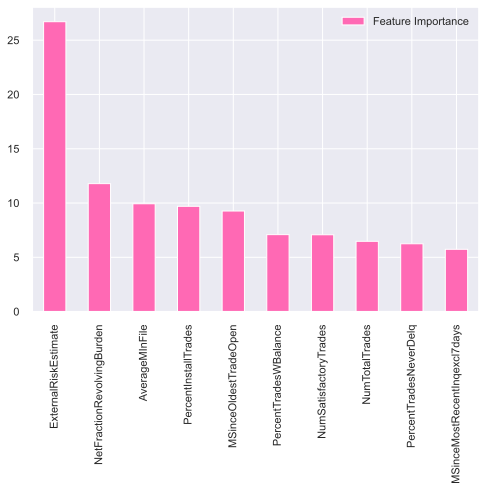

In [23]:
feature_importances = np.mean([tree.feature_importances_ for tree in decision_tree.estimators_], axis=0)

# bagging_featureImportance = pd.DataFrame({'Feature Importance':bagging.feature_importances_*100},index = X.columns)
bagging_featureImportance = pd.DataFrame({'Feature Importance':feature_importances*100},index = X.columns)
bagging_featureImportance.sort_values('Feature Importance', ascending=False).plot(kind='bar', color='hotpink')

**Decision Trees II: Random Forest**

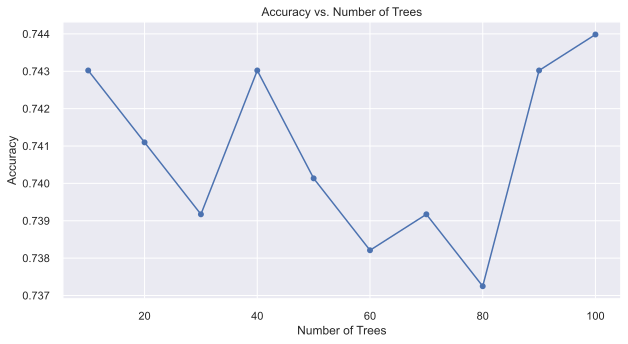

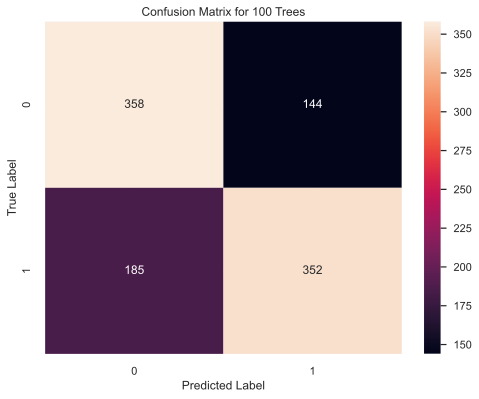

In [24]:
max_samples = 0.8
n_estimators_range = range(10, 101, 10) 
overall_accuracy = []

for n_estimators in n_estimators_range:
    predictions = []
    for _ in range(n_estimators):
        sample_indices = np.random.choice(X_train.index, size=int(len(X_train) * max_samples), replace=True)
        X_bootstrap = X_train.loc[sample_indices]
        y_bootstrap = y_train.loc[sample_indices]

        random_tree = RandomForestClassifier()
        random_tree.fit(X_bootstrap, y_bootstrap)

        y_pred = random_tree.predict(X_test)
        predictions.append(y_pred)

    predictions = np.array(predictions)
    majority_vote, _ = mode(predictions, axis=0)
    
    accuracy = accuracy_score(y_test, np.squeeze(majority_vote))
    overall_accuracy.append(accuracy)

plt.figure(figsize=(10, 5))
plt.plot(n_estimators_range, overall_accuracy, marker='o')
plt.title('Accuracy vs. Number of Trees')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

optimal_n_estimators = n_estimators_range[np.argmax(overall_accuracy)]
final_model = BaggingClassifier()
final_model.fit(X_train, y_train)
final_predictions = final_model.predict(X_test)

# Matriz de confusión final
conf_matrix = confusion_matrix(y_test, final_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix for {optimal_n_estimators} Trees')
plt.show()

In [25]:
# Calculate metrics
accuracy_RF = accuracy_score(y_test, np.squeeze(majority_vote))
precision = precision_score(y_test, np.squeeze(majority_vote), average='weighted')
recall = recall_score(y_test, np.squeeze(majority_vote), average='weighted')
f1 = f1_score(y_test, np.squeeze(majority_vote), average='weighted')

# Print metrics
print("Accuracy:", accuracy_RF)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.7439846005774784
Precision: 0.7439502787932321
Recall: 0.7439846005774784
F1-score: 0.7437906134977242


<Axes: >

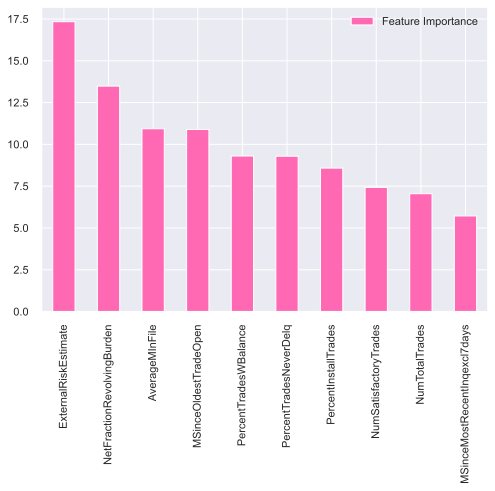

In [27]:
feature_importances = np.mean([tree.feature_importances_ for tree in random_tree.estimators_], axis=0)

# bagging_featureImportance = pd.DataFrame({'Feature Importance':bagging.feature_importances_*100},index = X.columns)
bagging_featureImportance = pd.DataFrame({'Feature Importance':feature_importances*100},index = X.columns)
bagging_featureImportance.sort_values('Feature Importance', ascending=False).plot(kind='bar', color='hotpink')

**Decision Trees III: Adaptative Boosting**

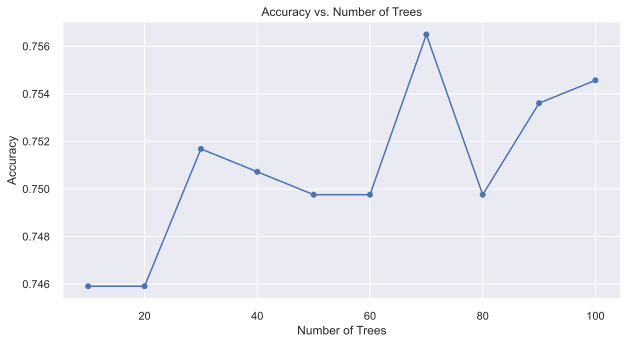

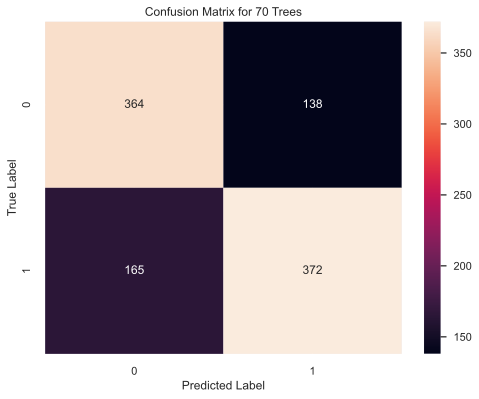

In [28]:
max_samples = 0.8
n_estimators_range = range(10, 101, 10) 
overall_accuracy = []

for n_estimators in n_estimators_range:
    predictions = []
    for _ in range(n_estimators):
        sample_indices = np.random.choice(X_train.index, size=int(len(X_train) * max_samples), replace=True)
        X_bootstrap = X_train.loc[sample_indices]
        y_bootstrap = y_train.loc[sample_indices]

        adaboost = AdaBoostClassifier()
        adaboost.fit(X_bootstrap, y_bootstrap)

        y_pred = adaboost.predict(X_test)
        predictions.append(y_pred)

    predictions = np.array(predictions)
    majority_vote, _ = mode(predictions, axis=0)
    
    accuracy = accuracy_score(y_test, np.squeeze(majority_vote))
    overall_accuracy.append(accuracy)

plt.figure(figsize=(10, 5))
plt.plot(n_estimators_range, overall_accuracy, marker='o')
plt.title('Accuracy vs. Number of Trees')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

optimal_n_estimators = n_estimators_range[np.argmax(overall_accuracy)]
final_model = BaggingClassifier()
final_model.fit(X_train, y_train)
final_predictions = final_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, final_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix for {optimal_n_estimators} Trees')
plt.show()

In [29]:
# Calculate metrics
accuracy_ada = accuracy_score(y_test, np.squeeze(majority_vote))
precision = precision_score(y_test, np.squeeze(majority_vote), average='weighted')
recall = recall_score(y_test, np.squeeze(majority_vote), average='weighted')
f1 = f1_score(y_test, np.squeeze(majority_vote), average='weighted')

# Print metrics
print("Accuracy:", accuracy_ada)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.7545717035611165
Precision: 0.7551148565940189
Recall: 0.7545717035611165
F1-score: 0.754641293319715


<Axes: >

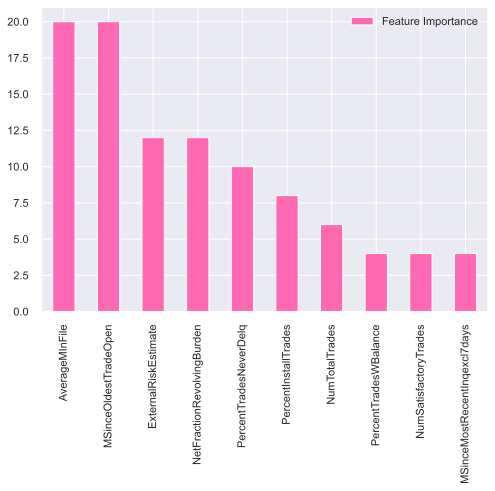

In [30]:
feature_importances = np.mean([tree.feature_importances_ for tree in adaboost.estimators_], axis=0)

# bagging_featureImportance = pd.DataFrame({'Feature Importance':bagging.feature_importances_*100},index = X.columns)
bagging_featureImportance = pd.DataFrame({'Feature Importance':feature_importances*100},index = X.columns)
bagging_featureImportance.sort_values('Feature Importance', ascending=False).plot(kind='bar', color='hotpink')

**Multi-layer Perceptron Classifier**

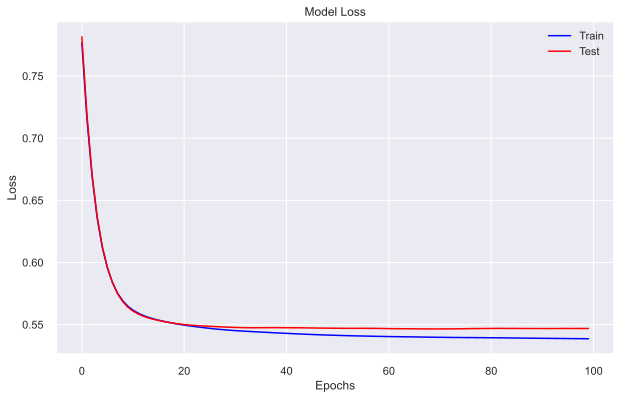

Accuracy on training set: 0.7370067372473532
Accuracy on test set: 0.7430221366698749


In [31]:
train_loss = []
test_loss = []

nn_model = MLPClassifier(hidden_layer_sizes=(16,),  
                         activation='relu',
                         solver='adam',
                         learning_rate_init=0.001,  
                         alpha=0.01,  
                         max_iter=1,
                         warm_start=True,
                         early_stopping=True, 
                         validation_fraction=0.1,  
                         n_iter_no_change=10, 
                         random_state=42)

for _ in range(100):  
    nn_model.fit(X_train_scaled, y_train)
    if nn_model.n_iter_ == nn_model.n_iter_no_change:
        break
    y_train_pred_probs = nn_model.predict_proba(X_train_scaled)
    train_loss.append(log_loss(y_train, y_train_pred_probs))
    y_test_pred_probs = nn_model.predict_proba(X_test_scaled)
    test_loss.append(log_loss(y_test, y_test_pred_probs))

plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Train', color='blue')
plt.plot(test_loss, label='Test', color='red')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

train_accuracy = nn_model.score(X_train_scaled, y_train)
print(f'Accuracy on training set: {train_accuracy}')

test_accuracy_perc = nn_model.score(X_test_scaled, y_test)
print(f'Accuracy on test set: {test_accuracy_perc}')

**Contrast of trained models**


In [32]:
classifiers = [
    ('Logistic Regression', LogReg_optimum_C),
    ('KNN', KNeighbors),
    ('Linear SVM', Linear_SVC_fit),
    ('Radial SVM', radial_svm), 
    ('Bagging', decision_tree),
    ('Random Forest', random_tree),
    ('Adaboost', adaboost),
    ('Multi-layer Perceptron', nn_model)
]

accuracy_scores = {}

for clf_name, clf in classifiers:
    clf.fit(X_train_scaled, y_train) 
    y_pred = clf.predict(X_test_scaled)  
    accuracy_scores[clf_name] = accuracy_score(y_test, y_pred)  

print('Accuracy scores: ', accuracy_scores)

Accuracy scores:  {'Logistic Regression': 0.7420596727622714, 'KNN': 0.7449470644850819, 'Linear SVM': 0.7382098171318575, 'Radial SVM': 0.7439846005774784, 'Bagging': 0.6929740134744947, 'Random Forest': 0.739172281039461, 'Adaboost': 0.7478344562078922, 'Multi-layer Perceptron': 0.7439846005774784}


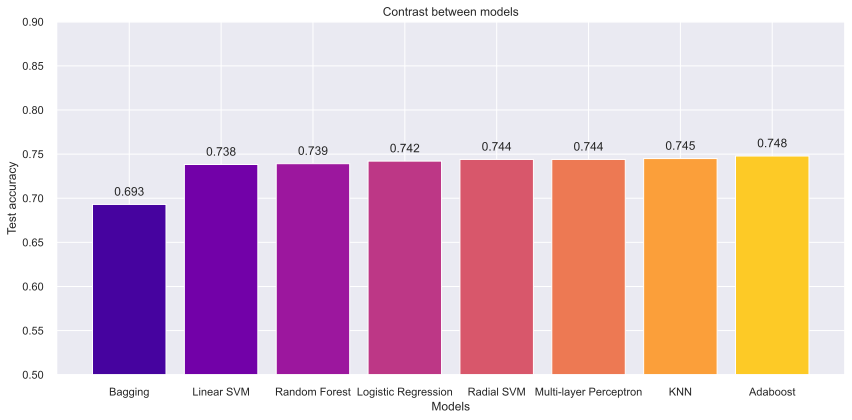

In [64]:
model_names = sorted(accuracy_scores, key=accuracy_scores.get)
scores = [accuracy_scores[model] for model in model_names]

palette = sns.color_palette("plasma", len(model_names))

plt.figure(figsize=(12, 6))
plt.bar(model_names, scores, color=palette)
plt.title('Contrast between models')
plt.xlabel('Models')
plt.ylabel('Test accuracy')
plt.ylim([0.5, 0.9])

for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.3f}', ha='center')

plt.tight_layout()
plt.show()

**Creativity and Innovation**

In [36]:
ensemble_classifiers = [
    ('Bagging', BaggingClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Adaboost', AdaBoostClassifier())
]

In [37]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

# Define el meta-modelo
meta_model = LogisticRegression()

# Define el ensemble de stacking
stack = StackingClassifier(estimators=ensemble_classifiers, final_estimator=meta_model, cv=5)

# Entrena el ensemble de stacking
stack.fit(X_train_scaled, y_train)

# Evalúa el ensemble en el conjunto de prueba
y_pred_stack = stack.predict(X_test_scaled)
accuracy_stack = accuracy_score(y_test, y_pred_stack)
print('Accuracy of Stacking:', accuracy_stack)

Accuracy of Stacking: 0.7382098171318575


In [38]:
from sklearn.ensemble import VotingClassifier

# Define el ensemble de voting, usando 'soft' si todos los clasificadores soportan predict_proba, de lo contrario usa 'hard'
voting = VotingClassifier(estimators=ensemble_classifiers, voting='hard')

# Entrena el ensemble de voting
voting.fit(X_train_scaled, y_train)

# Evalúa el ensemble en el conjunto de prueba
y_pred_voting = voting.predict(X_test_scaled)
accuracy_voting = accuracy_score(y_test, y_pred_voting)
print('Accuracy of Voting:', accuracy_voting)

Accuracy of Voting: 0.7295476419634264


#### **PART 3:** *Unsupervised Learning* -> preprocessing and cleansing

The objective of this part is to compare different clustering algorithms with a real dataset. Based on the training and test sets from Part 1, we will:
1. Do the PCA fitting process and analysis. 
2. Identify and do the fitting process of clustering algorithms. 

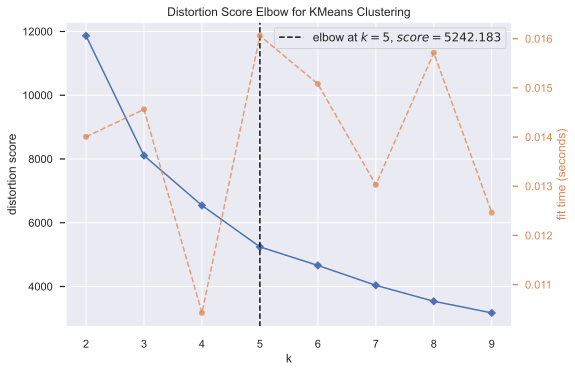

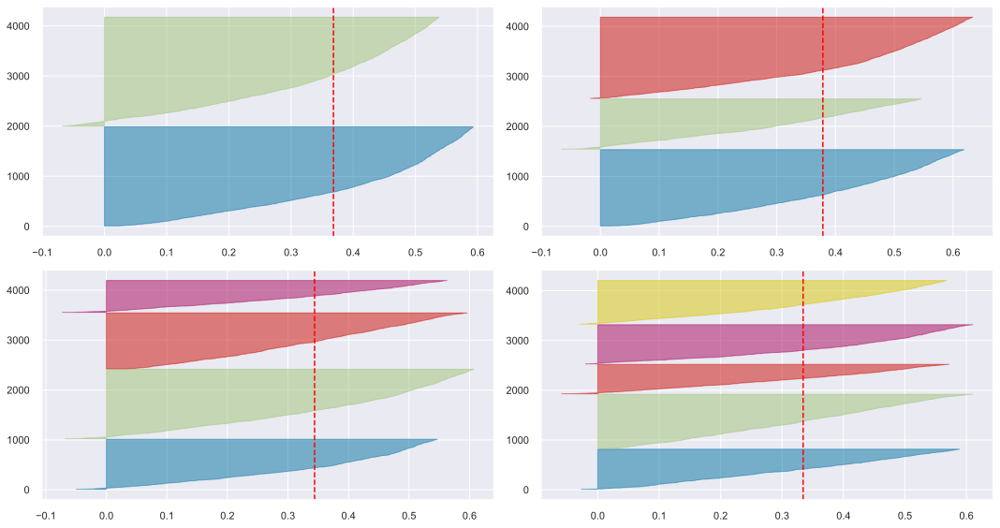

In [65]:
# ELBOW AND SILHOUETTE

pca = PCA(n_components=2)  
X_pca = pca.fit_transform(X_train_scaled)

km = KMeans(random_state=42)
visualizer = KElbowVisualizer(km, k=(2,10))
visualizer.fit(X_pca)  
visualizer.show()

fig, ax = plt.subplots(2, 2, figsize=(15,8))  
cluster_counts = [2, 3, 4, 5]

for i, k in enumerate(cluster_counts):
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[i//2, i%2])
    visualizer.fit(X_pca)  

plt.tight_layout()
plt.show()

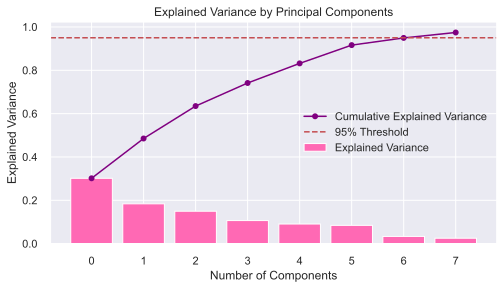

In [63]:
# Apply PCA
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)

# Create a figure for the plot
plt.figure(figsize=(8, 4))
# Plot the bar graph for explained variance
plt.bar(range(pca.n_components_), pca.explained_variance_ratio_, color="hotpink", label='Explained Variance')

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Add a line plot for cumulative explained variance using secondary y-axis
plt.plot(range(pca.n_components_), cumulative_variance, marker='o', color='purple', label='Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Threshold')

# Adding labels and title
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Explained Variance by Principal Components')

# Add a legend
plt.legend()

# Display the plot
plt.show()

In [42]:
components = pd.DataFrame(np.abs(pca.components_))

# Display the contribution of each feature to each component
print(components)


          0         1         2         3         4         5         6  \
0  0.398981  0.380064  0.319407  0.344326  0.397266  0.229769  0.306040   
1  0.363812  0.284777  0.016502  0.113126  0.182182  0.125148  0.583329   
2  0.153621  0.185685  0.605690  0.548926  0.146316  0.048732  0.180841   
3  0.267598  0.124403  0.116466  0.106373  0.431651  0.559411  0.004393   
4  0.207714  0.225747  0.117198  0.141636  0.055939  0.481086  0.047377   
5  0.090884  0.449763  0.078487  0.110216  0.249874  0.520180  0.060600   
6  0.169725  0.491989  0.033422  0.157430  0.724828  0.333773  0.080629   
7  0.368198  0.329904  0.519169  0.642894  0.098202  0.029593  0.118730   

          7         8         9  
0  0.286730  0.259487  0.148200  
1  0.602702  0.037369  0.140364  
2  0.142357  0.441314  0.047239  
3  0.019345  0.392542  0.484035  
4  0.041474  0.083216  0.791602  
5  0.119651  0.573877  0.301326  
6  0.118904  0.212769  0.023429  
7  0.084668  0.194323  0.056557  


In [44]:
# Hierarchical clustering dendogram
linkage_matrix = linkage(X_train_pca, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

In [45]:

kmeans = KMeans(n_clusters=2, random_state=0)
clusters_kmeans = kmeans.fit_predict(X_train_pca)
centers = kmeans.cluster_centers_

agg_clustering = AgglomerativeClustering(n_clusters=2)
clusters_agg = agg_clustering.fit_predict(X_train_pca)

gmm = GaussianMixture(n_components=2, random_state=0)  
gmm.fit(X_train_pca)
clusters_gmm = gmm.predict(X_train_pca)

In [46]:
plt.figure(figsize=(12, 18))  

# K-Means Clustering
plt.subplot(3, 2, 1)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', marker='o')
plt.title('Real Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.subplot(3, 2, 2)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=clusters_kmeans, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='x')
plt.title('K-means Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

# Hierarchical Clustering
plt.subplot(3, 2, 3)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', marker='o')
plt.title('Real Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.subplot(3, 2, 4)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=clusters_agg, cmap='viridis', marker='o')
plt.title('Agglomerative Hierarchical Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

# Gaussian Mixture Model Clustering
plt.subplot(3, 2, 5)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', marker='o')
plt.title('Real Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.subplot(3, 2, 6)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=clusters_gmm, cmap='viridis', marker='o')
plt.title('Gaussian Mixture Model Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.tight_layout()
plt.show()

**Creativity and Innovation**

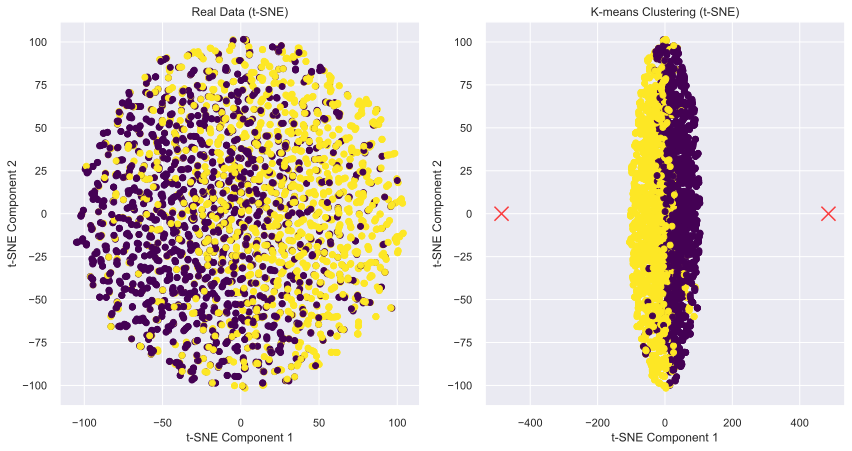

In [57]:
tsne_full = TSNE(n_components=2, random_state=42, perplexity=2)   
X_train_tsne = tsne_full.fit_transform(X_train_pca)  
plt.figure(figsize=(12, 18))

plt.subplot(3, 2, 1)
plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=y_train, cmap='viridis', marker='o')
plt.title('Real Data (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

plt.subplot(3, 2, 2)
plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=clusters_kmeans, cmap='viridis', marker='o')

tsne_centers = TSNE(n_components=2, random_state=42, perplexity=max(1, len(kmeans.cluster_centers_) - 1))
centers_tsne = tsne_centers.fit_transform(kmeans.cluster_centers_)
plt.scatter(centers_tsne[:, 0], centers_tsne[:, 1], c='red', s=200, alpha=0.75, marker='x')
plt.title('K-means Clustering (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

plt.tight_layout()
plt.show()

#### **PART 4:** *Conclusions* -> preprocessing and cleansing

The objective of this part is to analyze the results from previus parts. We will answer the questions posed in the report.